#Fire Segmentation

In [1]:
from tensorflow.keras.utils import normalize
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from keras.optimizers import Adam
import glob

In [2]:
from tensorflow import keras
from tensorflow.keras import layers
from google.colab import files

In [3]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install -q kaggle

In [ ]:
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle.json': b'{"username":"manikantan2001","key":"812bf71ae9b338af008b2c7dbba647e4"}'}

In [31]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [33]:
!kaggle datasets download -d diversisai/fire-segmentation-image-dataset

 99% 469M/472M [00:16<00:00, 37.9MB/s]
100% 472M/472M [00:16<00:00, 29.9MB/s]


In [34]:
!mkdir fire_segmentation

mkdir: cannot create directory ‘fire_segmentation’: File exists


In [35]:
!unzip fire-segmentation-image-dataset.zip -d fire_segmentation
print('done')

Streaming output truncated to the last 5000 lines.
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5375.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5376.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5377.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5378.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5379.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_538.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5380.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5381.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5382.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5383.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5384.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5385.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire/Img_5386.jpg  
  inflating: fire_segmentation/Segmentation_Mask/Fire

In [36]:
#define input and target directories
input_dir = 'fire_segmentation/Image/Fire/'
target_dir = 'fire_segmentation/Segmentation_Mask/Fire/'

In [37]:
Size = 256
num_imgs = 3000

In [38]:
image_names = glob.glob('fire_segmentation/Image/Fire/*.jpg')
print(image_names)

['fire_segmentation/Image/Fire/Img_17230.jpg', 'fire_segmentation/Image/Fire/Img_12001.jpg', 'fire_segmentation/Image/Fire/Img_6485.jpg', 'fire_segmentation/Image/Fire/Img_26869.jpg', 'fire_segmentation/Image/Fire/Img_8641.jpg', 'fire_segmentation/Image/Fire/Img_2049.jpg', 'fire_segmentation/Image/Fire/Img_15085.jpg', 'fire_segmentation/Image/Fire/Img_17823.jpg', 'fire_segmentation/Image/Fire/Img_3157.jpg', 'fire_segmentation/Image/Fire/Img_12188.jpg', 'fire_segmentation/Image/Fire/Img_27542.jpg', 'fire_segmentation/Image/Fire/Img_2908.jpg', 'fire_segmentation/Image/Fire/Img_5348.jpg', 'fire_segmentation/Image/Fire/Img_21579.jpg', 'fire_segmentation/Image/Fire/Img_23984.jpg', 'fire_segmentation/Image/Fire/Img_13487.jpg', 'fire_segmentation/Image/Fire/Img_22988.jpg', 'fire_segmentation/Image/Fire/Img_2658.jpg', 'fire_segmentation/Image/Fire/Img_8322.jpg', 'fire_segmentation/Image/Fire/Img_10755.jpg', 'fire_segmentation/Image/Fire/Img_908.jpg', 'fire_segmentation/Image/Fire/Img_21451.jpg

In [39]:
image_names.sort()
print(image_names)

['fire_segmentation/Image/Fire/Img_0.jpg', 'fire_segmentation/Image/Fire/Img_1.jpg', 'fire_segmentation/Image/Fire/Img_10.jpg', 'fire_segmentation/Image/Fire/Img_100.jpg', 'fire_segmentation/Image/Fire/Img_1000.jpg', 'fire_segmentation/Image/Fire/Img_10000.jpg', 'fire_segmentation/Image/Fire/Img_10001.jpg', 'fire_segmentation/Image/Fire/Img_10002.jpg', 'fire_segmentation/Image/Fire/Img_10003.jpg', 'fire_segmentation/Image/Fire/Img_10004.jpg', 'fire_segmentation/Image/Fire/Img_10005.jpg', 'fire_segmentation/Image/Fire/Img_10006.jpg', 'fire_segmentation/Image/Fire/Img_10007.jpg', 'fire_segmentation/Image/Fire/Img_10008.jpg', 'fire_segmentation/Image/Fire/Img_10009.jpg', 'fire_segmentation/Image/Fire/Img_1001.jpg', 'fire_segmentation/Image/Fire/Img_10010.jpg', 'fire_segmentation/Image/Fire/Img_10011.jpg', 'fire_segmentation/Image/Fire/Img_10012.jpg', 'fire_segmentation/Image/Fire/Img_10013.jpg', 'fire_segmentation/Image/Fire/Img_10014.jpg', 'fire_segmentation/Image/Fire/Img_10015.jpg', 'f

In [40]:
image_names_subset = image_names[0:num_imgs]

In [41]:
images = [cv2.imread(img) for img in image_names_subset]

In [42]:
image_dataset = np.array(images)

In [43]:
image_dataset.shape

(3000, 256, 256, 3)

In [44]:
mask_names = glob.glob('fire_segmentation/Segmentation_Mask/Fire/*.jpg')
mask_names.sort()
mask_names_subset = mask_names[0:num_imgs]
masks = []
for mask in mask_names_subset:
  mask_temp = cv2.imread(mask,0)
  (thresh, im_bw) = cv2.threshold(mask_temp, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
  thresh = 127
  im_bw = cv2.threshold(mask_temp, thresh, 255, cv2.THRESH_BINARY)[1]
  masks.append(im_bw)
mask_dataset = np.array(masks)
mask_dataset = np.expand_dims(mask_dataset,axis=3)

In [45]:
mask_dataset = mask_dataset /255.

In [46]:
#validation split (1000)
num_val = 500
train_input_imgs = image_dataset[:-num_val]
train_targets = mask_dataset[:-num_val]
val_input_imgs = image_dataset[-num_val:]
val_targets = mask_dataset[-num_val:]

In [47]:
train_targets.shape

(2500, 256, 256, 1)

In [48]:
def get_model(image_size,num_classes):
  inputs = keras.Input(shape=(Size,Size)+(3,))
  x = layers.Rescaling(1./255)(inputs)
  x = layers.Conv2D(64, 3, strides=2, activation="relu", padding="same")(x)
  x = layers.Conv2D(64, 3,activation="relu", padding="same")(x)
  x = layers.Conv2D(128, 3, strides=2, activation="relu", padding="same")(x)
  x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
  x = layers.Conv2D(256, 3, strides=2, activation="relu", padding="same")(x)
  x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)

  x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same")(x)
  x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same",strides=2)(x)
  x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
  x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same",strides=2)(x)
  x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
  x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same",strides=2)(x)

  outputs = layers.Conv2D(num_classes,1,activation='sigmoid',padding='same')(x)

  return keras.Model(inputs=inputs,outputs=outputs)

In [49]:
model = get_model(image_size=(Size,Size),num_classes=1)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 256)       295168

In [50]:
model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3),loss='binary_crossentropy')
callbacks = [
    keras.callbacks.ModelCheckpoint('gdrive/MyDrive/fire_segmentation.keras',save_best_only=True)
]

In [51]:
history = model.fit(train_input_imgs, train_targets, epochs=30,
                    callbacks=callbacks,
                    batch_size=64,
                    validation_data=(val_input_imgs, val_targets))

Epoch 1/30
40/40 [==============================] - 74s 1s/step - loss: 0.2112 - val_loss: 0.1079
Epoch 2/30
40/40 [==============================] - 34s 852ms/step - loss: 0.0648 - val_loss: 0.0796
Epoch 3/30
40/40 [==============================] - 34s 847ms/step - loss: 0.0447 - val_loss: 0.0608
Epoch 4/30
40/40 [==============================] - 33s 828ms/step - loss: 0.0326 - val_loss: 0.0632
Epoch 5/30
40/40 [==============================] - 34s 852ms/step - loss: 0.0322 - val_loss: 0.0562
Epoch 6/30
40/40 [==============================] - 33s 830ms/step - loss: 0.0259 - val_loss: 0.0582
Epoch 7/30
40/40 [==============================] - 34s 851ms/step - loss: 0.0242 - val_loss: 0.0521
Epoch 8/30
40/40 [==============================] - 34s 853ms/step - loss: 0.0213 - val_loss: 0.0456
Epoch 9/30
40/40 [==============================] - 34s 854ms/step - loss: 0.0198 - val_loss: 0.0433
Epoch 10/30
40/40 [==============================] - 33s 833ms/step - loss: 0.0194 - val_loss:

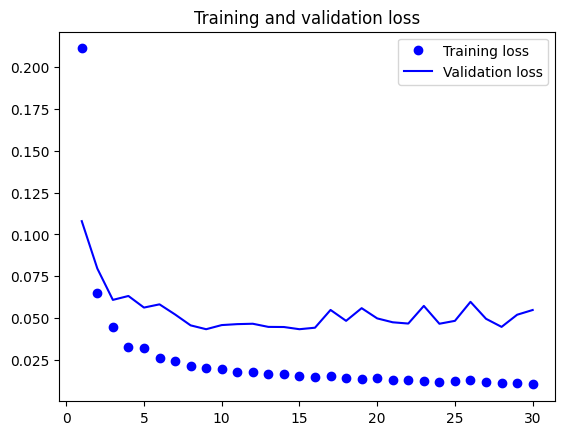

In [52]:
epochs = range(1,len(history.history['loss'])+1)
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure()
plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

In [62]:
import random
threshold = 0.5
test_img_number = random.randint(0,len(val_input_imgs)-1)
test_img = val_input_imgs[test_img_number]
ground_truth = val_targets[test_img_number]
test_img_input = np.expand_dims(test_img,0)
print(test_img_input.shape)
prediction = (model.predict(test_img_input)[0,:,:,0]>0.5).astype(np.uint8)
print(prediction.shape)

(1, 256, 256, 3)
1/1 [==============================] - 0s 32ms/step
(256, 256)


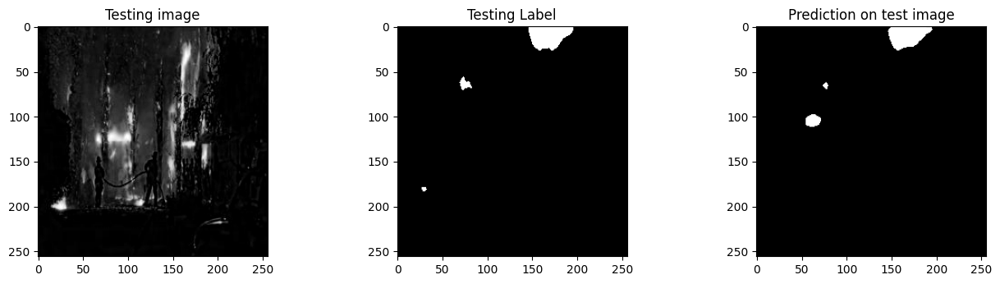

In [63]:
plt.figure(figsize=(16,8))
plt.subplot(231)
plt.title('Testing image')
plt.imshow(test_img[:,:,0],cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0],cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(prediction,cmap='gray')

plt.show()

#Intermediate Visualizations

In [9]:
from tensorflow import keras
model = keras.models.load_model("gdrive/MyDrive/fire_segmentation.keras")
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 128)       147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 256)       295168

In [10]:
image_path = "fire_segmentation_sample_img.jpg"

In [17]:
def get_img_array(image_path,target_size):
  img = keras.utils.load_img(image_path,target_size=target_size)
  array = keras.utils.img_to_array(img)
  array = np.expand_dims(array,axis=0)
  return array

In [21]:
img_tensor = get_img_array(image_path,target_size=(256,256))

In [22]:
img_tensor.shape

(1, 256, 256, 3)

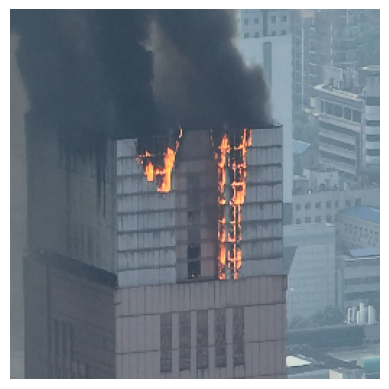

In [23]:
import matplotlib.pyplot as plt
plt.axis('off')
plt.imshow(img_tensor[0].astype('uint8'))
plt.show()

In [24]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
  if isinstance(layer,(layers.Conv2D,layers.Conv2DTranspose)):
    layer_outputs.append(layer.output)
    layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input,outputs=layer_outputs)

In [25]:
activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
print(first_layer_activation.shape)

1/1 [==============================] - 10s 10s/step
(1, 128, 128, 64)


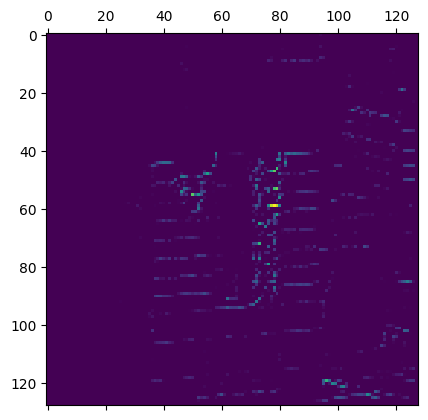

In [14]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0,:,:,1],cmap="viridis")

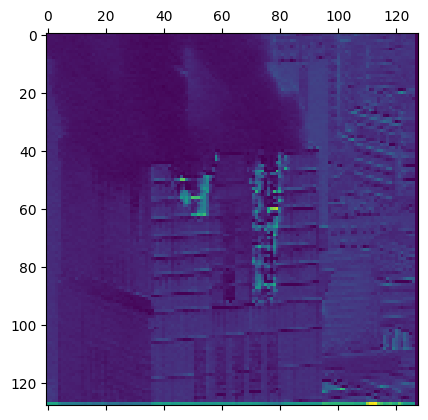

In [15]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0,:,:,3],cmap="viridis")

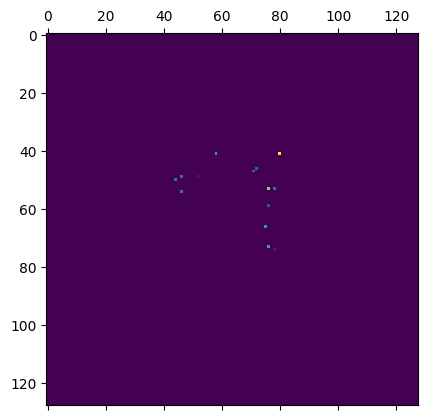

In [16]:
import matplotlib.pyplot as plt
plt.matshow(first_layer_activation[0,:,:,50],cmap="viridis")

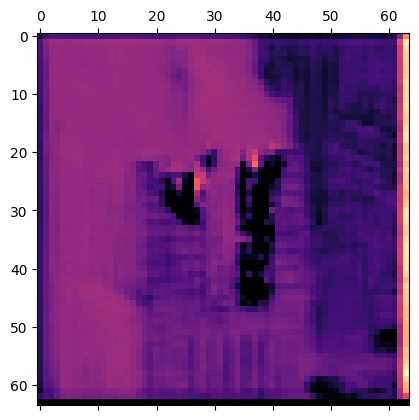

In [28]:
layer4_activation = activations[3]
plt.matshow(layer4_activation[0,:,:,5],cmap="magma")

ValueError: ignored

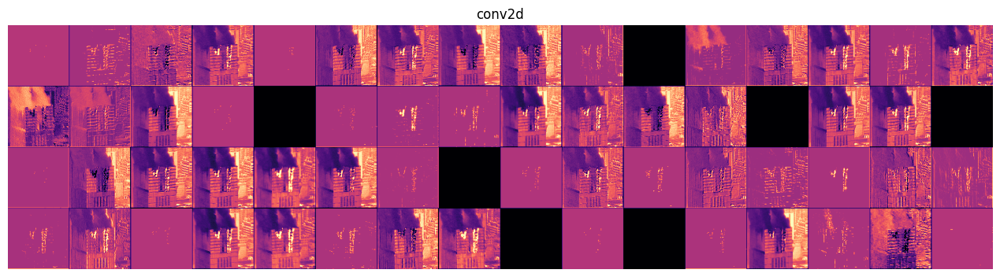

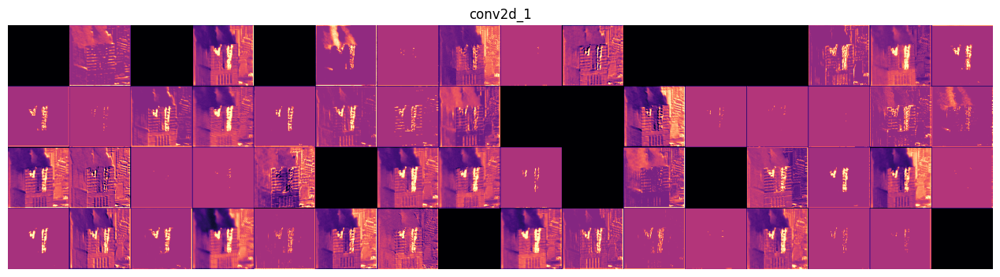

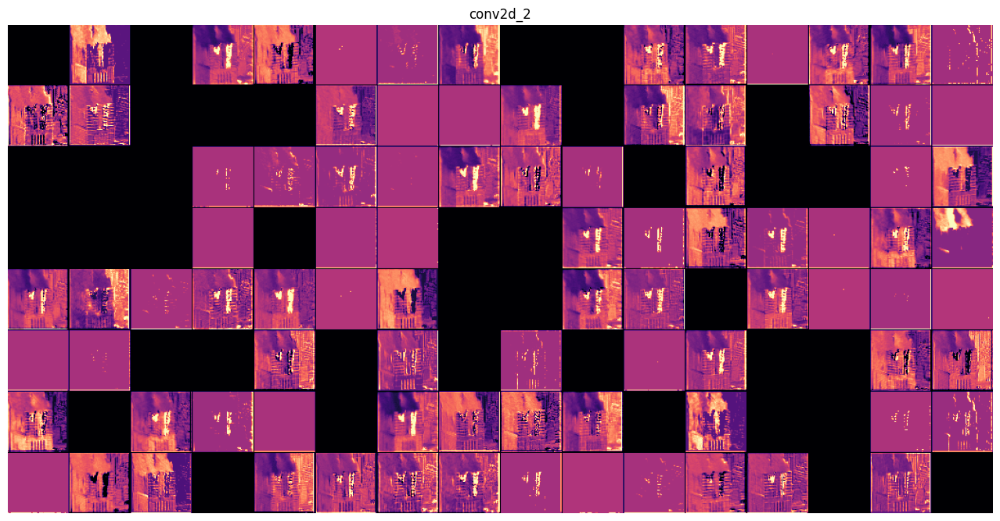

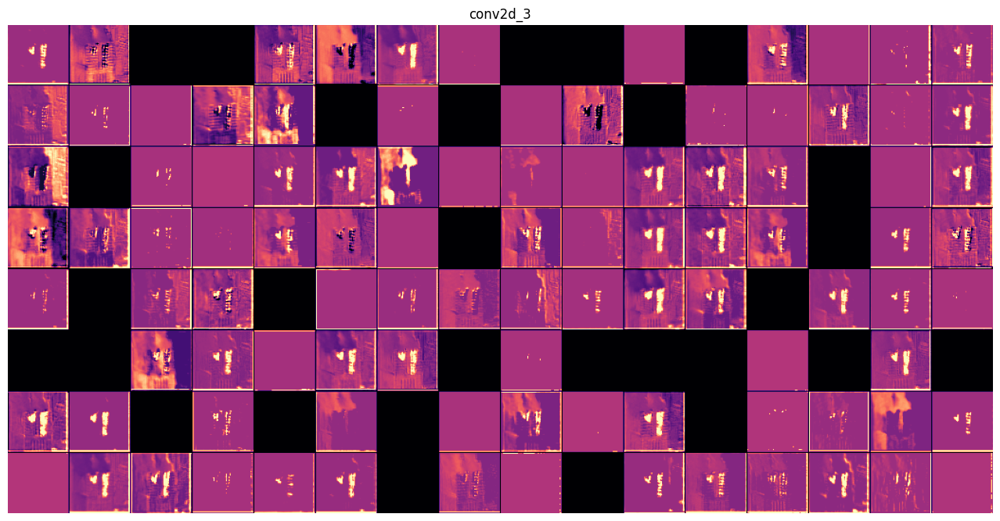

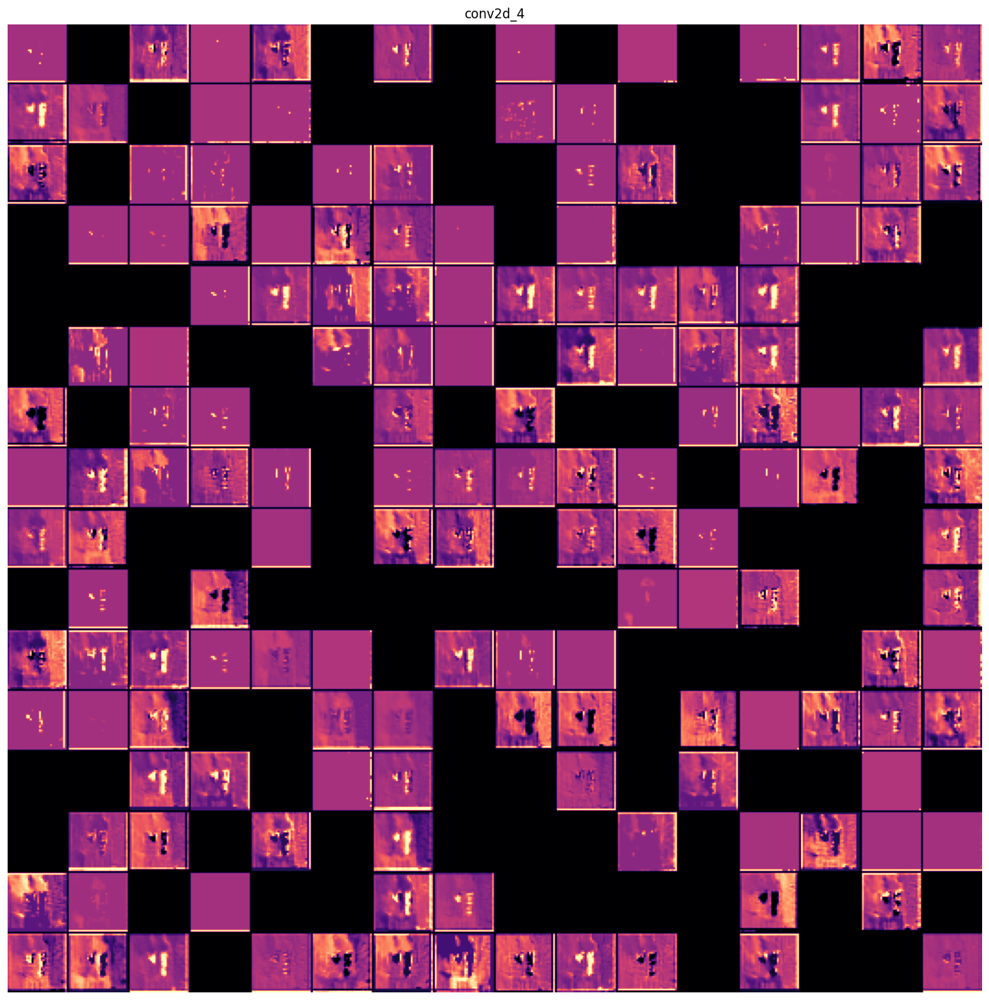

...

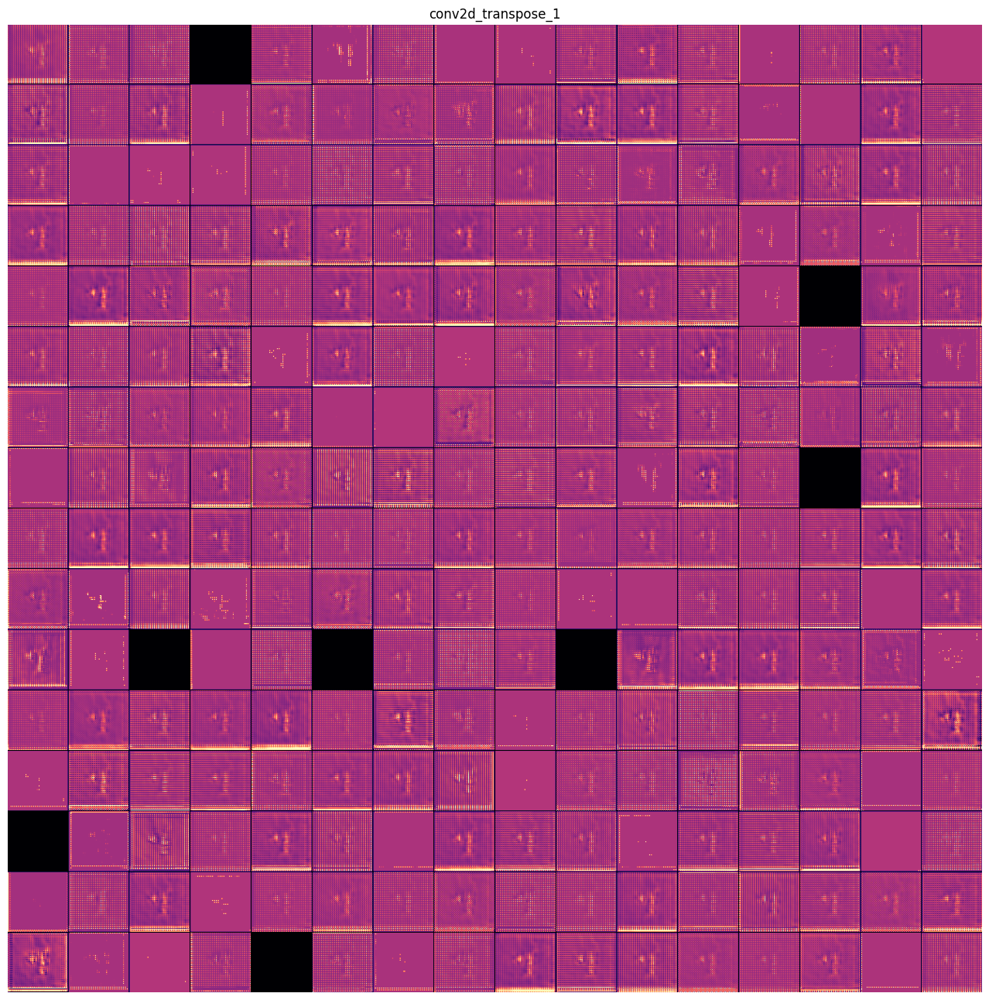

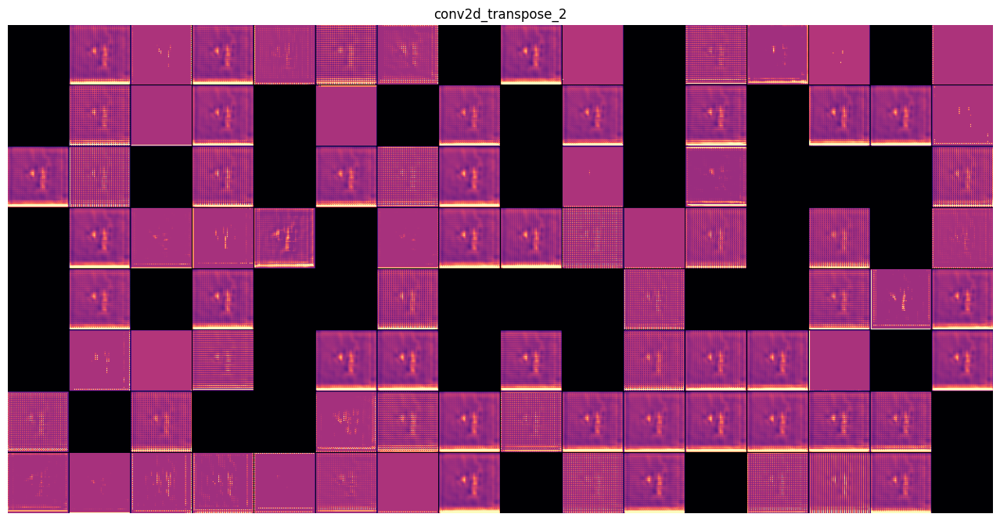

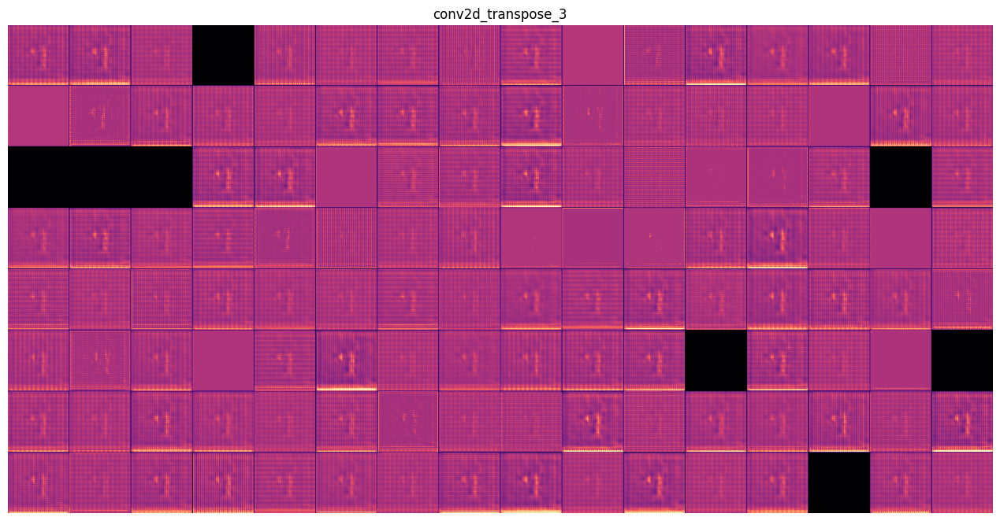

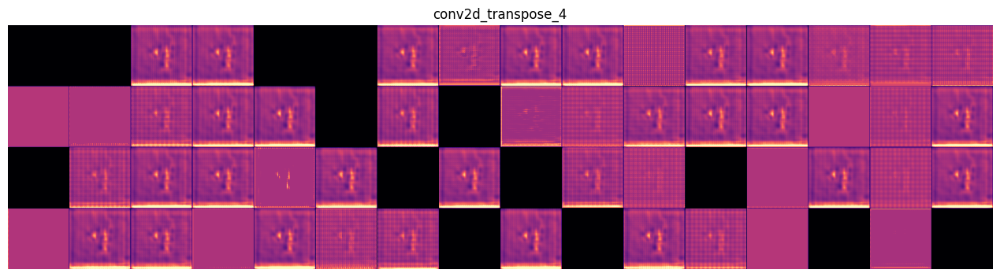

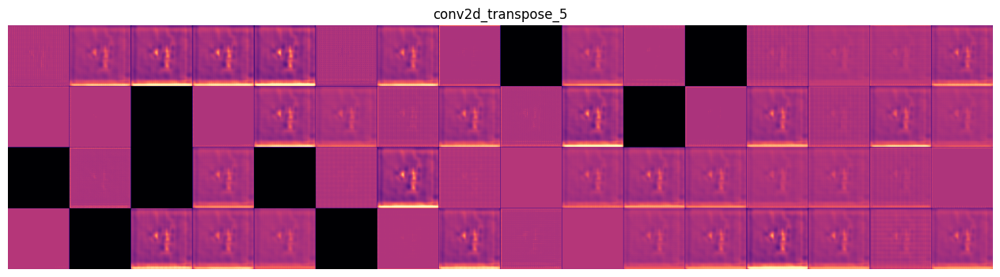

In [33]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
  for col in range(n_cols):
    for row in range(images_per_row):
      channel_index = col * images_per_row + row
      channel_image = layer_activation[0, :, :, channel_index].copy()
      if channel_image.sum() != 0: 
        channel_image -= channel_image.mean() 
        channel_image /= channel_image.std() 
        channel_image *= 64
        channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype("uint8") 
      display_grid[
            col * (size + 1): (col + 1) * size + col,
            row * (size + 1) : (row + 1) * size + row] = channel_image
  scale = 1./size
  plt.figure(figsize=(scale * display_grid.shape[1],
                    scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.axis("off")
  plt.imshow(display_grid, aspect="auto", cmap="magma")